In [ ]:
!pip install kaggle

**Importing the packages**

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import tensorflow as tf
import os
batch_size = 40
%matplotlib inline


from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D
from keras.layers import Activation, Dropout, Dense

In [ ]:


from google.colab import files
files.upload()

Saving download33.mp4 to download33.mp4


{'download33.mp4': b'\x00\x00\x00 ftypisom\x00\x00\x02\x00isomiso2avc1mp41\x00\x00\x00\x08free\x00I\x14\tmdat\x00\x00\x02\xaa\x06\x05\xff\xff\xa6\xdcE\xe9\xbd\xe6\xd9H\xb7\x96,\xd8 \xd9#\xee\xefx264 - core 155 r2917 0a84d98 - H.264/MPEG-4 AVC codec - Copyleft 2003-2018 - http://www.videolan.org/x264.html - options: cabac=1 ref=1 deblock=1:0:0 analyse=0x3:0x3 me=dia subme=1 psy=1 psy_rd=1.00:0.00 mixed_ref=0 me_range=16 chroma_me=1 trellis=0 8x8dct=1 cqm=0 deadzone=21,11 fast_pskip=1 chroma_qp_offset=0 threads=11 lookahead_threads=1 sliced_threads=0 nr=0 decimate=1 interlaced=0 bluray_compat=0 constrained_intra=0 bframes=3 b_pyramid=2 b_adapt=1 b_bias=0 direct=1 weightb=1 open_gop=0 weightp=1 keyint=250 keyint_min=25 scenecut=40 intra_refresh=0 rc=crf mbtree=0 crf=23.0 qcomp=0.60 qpmin=0 qpmax=69 qpstep=4 ip_ratio=1.40 pb_ratio=1.30 aq=1:1.00\x00\x80\x00\x00T\xa5e\x88\x84\x007\xff\xcco\x82\xed\xfe\xbe\x83/\x9e\x7f\xff\xfb\xddyD=E\xfcp\xa5\xe9\xc0\xdfD\xb2\xc6\xbcr\x7fP\x00\x00\x03\x00\x

**Downloading dataset**

In [ ]:
# Upload data to Google Colab
import os
os.environ['KAGGLE_USERNAME'] = "abhilashabhagat1" # username from the json file
os.environ['KAGGLE_KEY'] = "d8acee828b66d875c15359220cec6d67" # key from the json file
!kaggle datasets download -d drakedtrex/my-nsfw-dataset

my-nsfw-dataset.zip: Skipping, found more recently modified local copy (use --force to force download)


**Uzipping the zip folder downloaded content**

In [ ]:
!unzip /content/my-nsfw-dataset.zip

Archive:  /content/my-nsfw-dataset.zip
  inflating: test/test/NSFW (1).jpg  
  inflating: test/test/NSFW (1).png  
  inflating: test/test/NSFW (10).jpg  
  inflating: test/test/NSFW (11).jpg  
  inflating: test/test/NSFW (12).jpg  
  inflating: test/test/NSFW (13).jpg  
  inflating: test/test/NSFW (14).jpg  
  inflating: test/test/NSFW (15).jpg  
  inflating: test/test/NSFW (16).jpg  
  inflating: test/test/NSFW (17).jpg  
  inflating: test/test/NSFW (18).jpg  
  inflating: test/test/NSFW (19).jpg  
  inflating: test/test/NSFW (2).jpg  
  inflating: test/test/NSFW (2).png  
  inflating: test/test/NSFW (20).jpg  
  inflating: test/test/NSFW (21).jpg  
  inflating: test/test/NSFW (22).jpg  
  inflating: test/test/NSFW (23).jpg  
  inflating: test/test/NSFW (24).jpg  
  inflating: test/test/NSFW (25).jpg  
  inflating: test/test/NSFW (26).jpg  
  inflating: test/test/NSFW (27).jpg  
  inflating: test/test/NSFW (28).jpg  
  inflating: test/test/NSFW (29).jpg  
  inflating: test/test/NSFW (

**Setting path of training images**

In [ ]:
path = '/content/train/train//'
NSFW = os.listdir(path + 'NSFW/')
SFW = os.listdir(path + 'SFW/')

**Input image Processing**

 This function extracts image features for each image in img_paths 
        Returned features is a numpy array with shape (len(img_paths), 2048).
  

In [ ]:
resnet = tf.keras.applications.resnet50.ResNet50(include_top=False)
preprocess_input = tf.keras.applications.resnet50.preprocess_input
image = tf.keras.preprocessing.image


94773248/94765736 [==============================] - 2s 0us/step


In [ ]:
def extract_features(img_paths, batch_size=batch_size):
    """ This function extracts image features for each image in img_paths using ResNet50 bottleneck layer.
        Returned features is a numpy array with shape (len(img_paths), 2048).
    """
    global resnet
    n = len(img_paths)
    img_array = np.zeros((n, 299, 299, 3))
    
    for i, path in enumerate(img_paths):
        img = image.load_img(path, target_size=(299, 299))
        img = image.img_to_array(img)
        img = np.expand_dims(img, axis=0)
        x = preprocess_input(img)
        img_array[i] = x
    
    X = resnet.predict(img_array, batch_size=batch_size, verbose=1)
    X = X.reshape(n, 2048, -1)
    return X


**Extracting features of train images present in train folder**

In [ ]:
X = extract_features(
    list(map(lambda x: path + 'NSFW/' + x, NSFW)) + list(map(lambda x: path + 'SFW/' + x, SFW))
)
y = np.array([1] * len(NSFW) + [0] * len(SFW))

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:2766: DecompressionBombWarning: Image size (147659204 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  DecompressionBombWarning,


37/37 [==============================] - 384s 10s/step


In [ ]:
def net():
    model = tf.keras.models.Sequential([
      tf.keras.layers.Flatten(),
      tf.keras.layers.Dense(128, activation=tf.nn.relu),
      tf.keras.layers.Dropout(0.4),
      tf.keras.layers.Dense(1, activation=tf.nn.sigmoid)
    
    ])
    return model

**Splitting the train and test data**

In [ ]:
from sklearn.model_selection import train_test_split

X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.3, random_state=42)

In [ ]:
model = net()

In [ ]:
X_train.shape

(1033, 2048, 100)

In [ ]:
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D
from keras.layers import Activation, Dropout, Dense

np.random.seed(42)

epochs = 10

model = net()
model.compile(optimizer='adam',
              loss='binary_crossentropy',
              metrics=['accuracy'])

history = model.fit(X_train, y_train,
                    validation_data=(X_val, y_val),
                    batch_size=batch_size,
                    epochs=epochs)

Epoch 1/10
26/26 [==============================] - 5s 198ms/step - loss: 12.7115 - accuracy: 0.8103 - val_loss: 8.6742 - val_accuracy: 0.7878
Epoch 2/10
26/26 [==============================] - 5s 192ms/step - loss: 1.6370 - accuracy: 0.9313 - val_loss: 0.7486 - val_accuracy: 0.9345
Epoch 3/10
26/26 [==============================] - 5s 187ms/step - loss: 0.1083 - accuracy: 0.9768 - val_loss: 0.4482 - val_accuracy: 0.9458
Epoch 4/10
26/26 [==============================] - 5s 191ms/step - loss: 0.0961 - accuracy: 0.9739 - val_loss: 0.2888 - val_accuracy: 0.9436
Epoch 5/10
26/26 [==============================] - 5s 189ms/step - loss: 0.0276 - accuracy: 0.9894 - val_loss: 0.2127 - val_accuracy: 0.9526
Epoch 6/10
26/26 [==============================] - 5s 188ms/step - loss: 0.0297 - accuracy: 0.9932 - val_loss: 0.2137 - val_accuracy: 0.9549
Epoch 7/10
26/26 [==============================] - 5s 187ms/step - loss: 0.0067 - accuracy: 0.9981 - val_loss: 0.2375 - val_accuracy: 0.9549
Epoch

***Plotting Train Accuracy and test Accuracy ***

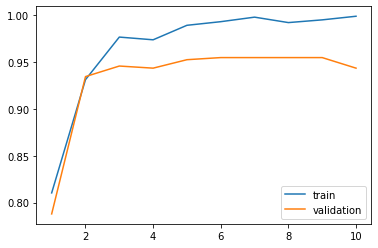

In [ ]:
plt.plot(range(1,epochs+1), history.history['accuracy'], label='train')
plt.plot(range(1,epochs+1), history.history['val_accuracy'], label='validation')
plt.legend()

**Plotting Train and test Loss**

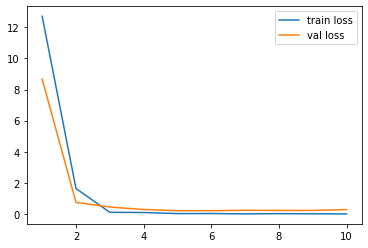

In [ ]:
plt.plot(range(1,epochs+1), history.history['loss'], label='train loss')
plt.plot(range(1,epochs+1), history.history['val_loss'], label='val loss')
plt.legend()

In [ ]:
model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_1 (Flatten)          (None, 204800)            0         
_________________________________________________________________
dense_2 (Dense)              (None, 128)               26214528  
_________________________________________________________________
dropout_1 (Dropout)          (None, 128)               0         
_________________________________________________________________
dense_3 (Dense)              (None, 1)                 129       
Total params: 26,214,657
Trainable params: 26,214,657
Non-trainable params: 0
_________________________________________________________________


In [ ]:
resnet.summary()

Model: "resnet50"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, None, None,  0                                            
__________________________________________________________________________________________________
conv1_pad (ZeroPadding2D)       (None, None, None, 3 0           input_1[0][0]                    
__________________________________________________________________________________________________
conv1_conv (Conv2D)             (None, None, None, 6 9472        conv1_pad[0][0]                  
__________________________________________________________________________________________________
conv1_bn (BatchNormalization)   (None, None, None, 6 256         conv1_conv[0][0]                 
___________________________________________________________________________________________

**Extracting features of test images present in test folder**

In [ ]:
test_path = r'/content/test/test//'
test = os.listdir(test_path)

In [ ]:
X_test = extract_features(list(map(lambda x: test_path + x, test)))

5/5 [==============================] - 43s 9s/step


In [ ]:
y_pred = model.predict(X_test)

In [ ]:
pred = pd.DataFrame({
    'id': test,
    'present': (y_pred > .5).reshape(-1)
})
pred['present'] = pred['present'].map({True: 1, False: 0})

In [ ]:
pred.to_csv(r'/content/pred_test.csv', index=False)

**Extract frames from video**

In [ ]:
!pip install constants

  Created wheel for constants: filename=constants-0.6.0-cp36-none-any.whl size=5460 sha256=eaa255d46bb3b259674ac126b3ba1f25b9eba220075dc8f180f3390e7e9e1f49
  Stored in directory: /root/.cache/pip/wheels/75/a1/25/7e051dae7d8fb9db1c04b0fe309a8bea40111080d3b62f1ca9
Successfully built constants


In [ ]:
import numpy as np
import cv2
from constants import*
def format_image(frame):
  if len(frame.shape) > 2 and frame.shape[2] == 3:
    frame = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
  else:
    frame = cv2.imdecode(frame, cv2.CV_LOAD_IMAGE_GRAYSCALE)
  frame = cv2.resize(frame, (299, 299), interpolation = cv2.INTER_CUBIC)
  return frame	

**Extracting image frames from video and Time information**

In [ ]:
# Importing all necessary libraries 
import cv2 
import os 

# Read the video from specified path 
cam = cv2.VideoCapture("download33.mp4") 
fps = cam.get(cv2.CAP_PROP_FPS)
try: 
	
	# creating a folder named data 
	if not os.path.exists('data11'): 
		os.makedirs('data11') 

# if not created then raise error 
except OSError: 
	print ('Error: Creating directory of data') 

# frame 
currentframe = 0
count=0
frame_list=[]
time_list=[]
while(True): 
	
	# reading from frame 
	ret,frame = cam.read() 

	if ret:
		# if video is still left continue creating images
		name = '/content/data11/frame' + str(currentframe) + '.jpg'
		print ('Creating...' + name)
	  
		# writing the extracted images
		cv2.imwrite(name, frame)
		name1='frame'+str(currentframe)+'.jpg'
		frame_list.append(name1)
		# show how many frames are created
		currentframe += 1
		count+=1
		print("time stamp current frame:",count/fps)
		tr=count/fps  
		#frame_list.append(fr)
		time_list.append(tr)
    
	else: 
		break

# Release all space and windows once done 
cam.release() 
#cv2.destroyAllWindows() 


Creating.../content/data11/frame0.jpg
time stamp current frame: 0.04
Creating.../content/data11/frame1.jpg
time stamp current frame: 0.08
Creating.../content/data11/frame2.jpg
time stamp current frame: 0.12
Creating.../content/data11/frame3.jpg
time stamp current frame: 0.16
Creating.../content/data11/frame4.jpg
time stamp current frame: 0.2
Creating.../content/data11/frame5.jpg
time stamp current frame: 0.24
Creating.../content/data11/frame6.jpg
time stamp current frame: 0.28
Creating.../content/data11/frame7.jpg
time stamp current frame: 0.32
Creating.../content/data11/frame8.jpg
time stamp current frame: 0.36
Creating.../content/data11/frame9.jpg
time stamp current frame: 0.4
Creating.../content/data11/frame10.jpg
time stamp current frame: 0.44
Creating.../content/data11/frame11.jpg
time stamp current frame: 0.48
Creating.../content/data11/frame12.jpg
time stamp current frame: 0.52
Creating.../content/data11/frame13.jpg
time stamp current frame: 0.56
Creating.../content/data11/frame

**Testing on extracted image frame from video**

In [ ]:
test_path = '/content/data11//'
test = os.listdir(test_path)

In [ ]:
X_test = extract_features(list(map(lambda x: test_path + x, test)))

27/27 [==============================] - 268s 10s/step


In [ ]:
y_pred = model.predict(X_test)
pred = pd.DataFrame({
    'id': test,
    'present': (y_pred > .5).reshape(-1)
})
pred['present'] = pred['present'].map({True: 1, False: 0})


In [ ]:
pred.to_csv('/content/pred1_data.csv', index=False)
pred

,id,present
0,frame674.jpg,0
1,frame250.jpg,0
2,frame838.jpg,1
3,frame170.jpg,0
4,frame607.jpg,0
...,...,...
1038,frame127.jpg,0
1039,frame881.jpg,0
1040,frame441.jpg,0
1041,frame905.jpg,0


In [ ]:
# Import pandas package  
import pandas as pd 
  
# Define a dictionary containing Students data 
data = {'frame': frame_list, 
        'time': time_list} 
  
# Convert the dictionary into DataFrame 
newdf = pd.DataFrame(data) 

In [ ]:
res = newdf.merge(pred, how='inner', left_on=['frame'], right_on=['id'])
res.head()

,frame,time,id,present
0,frame0.jpg,0.04,frame0.jpg,0
1,frame1.jpg,0.08,frame1.jpg,0
2,frame2.jpg,0.12,frame2.jpg,0
3,frame3.jpg,0.16,frame3.jpg,0
4,frame4.jpg,0.20,frame4.jpg,0


**Presence of NSFW content along with time details**

In [ ]:
res.drop(columns=['id'])

,frame,time,present
0,frame0.jpg,0.04,0
1,frame1.jpg,0.08,0
2,frame2.jpg,0.12,0
3,frame3.jpg,0.16,0
4,frame4.jpg,0.20,0
...,...,...,...
1038,frame1038.jpg,41.56,0
1039,frame1039.jpg,41.60,1
1040,frame1040.jpg,41.64,1
1041,frame1041.jpg,41.68,1


**Saving model**

In [ ]:
model.save("my_model")
import keras
model = keras.models.load_model("/content/my_model")

Instructions for updating:
This property should not be used in TensorFlow 2.0, as updates are applied automatically.
Instructions for updating:
This property should not be used in TensorFlow 2.0, as updates are applied automatically.
INFO:tensorflow:Assets written to: my_model/assets
